In [570]:
import random

import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

In [857]:
### parent class for all cell types
class Cell:
    def __init__(
        self,
        kind,
        origin,
    ):
        '''
        Initialization of immune system state manager.

        Parameters
        ----------
        origin: string, optional
            Origin of cell. Options: 'host', 'donor', 'cancer'
        '''
        
        self.origin = origin
        self.kind = kind
        self.alive = True
        
    def cell_death(self):
        self.alive = False

### class describing cytotoxic CD8+ T cells
class TCell(Cell):
    def __init__(
        self,
        origin,
        p_kill_baseline,
        deplete,
        kind='tcell',
    ):
        '''
        Initialization of CD8+ T cells.

        Parameters
        ----------
        p_kill_baseline: float
            Probability that CD8+ T cell will kill a foreign cell at 0% MHC overlap
        '''
        
        super().__init__(kind, origin)
        if origin == 'donor':  # depletion
            self.p_kill_baseline = p_kill_baseline * deplete
        else:
            self.p_kill_baseline = p_kill_baseline
        
    def interact(self, other_cell, mhc_overlap_perc, **kwargs):
        if other_cell.origin == self.origin:
            non_action_factor = 1  # cells from the same source don't kill each other
        elif self.origin == 'host' and other_cell.origin == 'cancer':
            non_action_factor = 0.95  # 5% mutated 
        elif self.origin == 'donor' and other_cell.origin == 'cancer':
            non_action_factor = 0.95 * mhc_overlap_perc
        else:  # donor and host relationship
            non_action_factor = mhc_overlap_perc
            
        if other_cell.kind == 'normal':
            non_action_factor += (1 - non_action_factor) / 1.2  # normal cells trigger IS less
        
        if random.random() < self.p_kill_baseline * (1 - non_action_factor):
            other_cell.cell_death()  # destroy other cell
        
### class describing myeloid cells (donor-normal/host-cancer)
class MyeloidCell(Cell):
    def __init__(
        self,
        origin,
        rel_aml_potency,
        kind='myeloid'
    ):
        '''
        Initialization of myeloid cells.

        Parameters
        ----------
        rel_aml_potency: float
            How much more resource-demanding AML are relative to normal myeloid cells
            
        '''
        
        super().__init__(kind, origin)
        self.rel_aml_potency = rel_aml_potency
    
    def interact(self, other_cell, mhc_overlap_perc, **kwargs):
        pass  # no interaction and no induced death
            
### class describing myeloid cells (host-normal/donor-normal/host-cancer)
class NormalCell(Cell):
    def __init__(
        self,
        p_cell_death,
        origin='host',
        kind='normal'
    ):
        '''
        Initialization of CD8+ T cells.

        Parameters
        ----------
        p_cell_death: float
            Probability of cell death when cell death threshold is reached
        '''
        
        super().__init__(kind, origin)
        self.p_cell_death = p_cell_death
    
    def no_oxygen(self):  # not enough healthy myeloid to deliver oxygen
        if random.random() < self.p_cell_death:
            self.cell_death()

In [967]:
### system-wide parameters and interaction management in a small-scale immune system
class ImmuneSystem:
    def __init__(
        self,
        mhc_overlap_perc=0.5,
        t_deplete_perc=1.0,
        p_kill_baseline=0.35,
        
        cap_cell_norm=100,
        cell_aml_count=15,
        cell_myeloid_count=15,
        cap_myeloid=40,
        rel_aml_potency=1.21,
        
        cap_t=15,
        cell_t_count_host=3,
        ratio_t_myeloid=1/2,
        
        thres_cell_death=0.2,
        p_cell_death=0.95,
    ):
        '''
        Initialization of local immune system state manager.
        
        Parameters
        ----------
        mhc_overlap_perc: float, optional
            Percentage of MHC coding sequence overlap between host and donor cells
        t_deplete_perc: float, optional
            Level of T cell AFTER depletion from HSCT
        p_kill_baseline: float
            Probability that CD8+ T cell will kill a foreign cell at 0% MHC overlap
        
        cap_cell_norm: int, optional
            Non-blood local cell count (and maximum boundary)
        cell_aml_count: int, optional
            Initial AML cell count in the host
        cap_myeloid: int, optional
            Maximal count of myeloid cells production
        cell_myeloid_count: int, optional
            Transplant myeloid cell count
        rel_aml_potency: float, optional
            How much more resource-demanding AML are relative to normal myeloid cells

        cap_t: int, optional
            How many total T cells there can be
        cell_t_count_host: int, optional
            How many host T cells are there
        ratio_t_myeloid: float, optional
            Ratio of T cell count to myeloid cell count in an HSCT
            
        thres_cell_death: float, optional
            Lowest survival proportion of healthy to total myeloid cells    
        p_cell_death: float, optional
            Probability of cell death when cell death threshold is reached
        '''
        
        # toggles
        self.mhc_overlap_perc = mhc_overlap_perc
        self.t_deplete_perc = t_deplete_perc
        self.p_kill_baseline = p_kill_baseline
        
        # cell counts
        self.cap_cell_norm = cap_cell_norm
        self.cell_norm_count = cap_cell_norm
        self.cell_aml_count = cell_aml_count
        self.cell_myeloid_count = cell_myeloid_count
        self.cap_myeloid = cap_myeloid
        self.rel_aml_potency = rel_aml_potency
        
        # t cells
        self.cap_t = cap_t
        self.cell_t_count_donor = min(cap_t, int(ratio_t_myeloid * self.cell_myeloid_count))
        self.cell_t_count_host = min(cell_t_count_host, cap_t - self.cell_t_count_donor)
        
        # system boundary conditions
        self.thres_cell_death = thres_cell_death
        self.p_cell_death = p_cell_death
        
        self.initialize_network()
        
    def initialize_network(self):
        '''
        Initialize cell objects in a fully-connected graph
        '''

        cell_counts = [
            {'count': self.cell_norm_count, 'cell_type': 'normal', 'origin': 'host'},
            {'count': self.cell_aml_count, 'cell_type': 'myeloid', 'origin': 'cancer'},
            {'count': self.cell_myeloid_count, 'cell_type': 'myeloid', 'origin': 'donor'},
            {'count': self.cell_t_count_host, 'cell_type': 'tcell', 'origin': 'host'},
            {'count': self.cell_t_count_donor, 'cell_type': 'tcell', 'origin': 'donor'},
        ]
        
        # total cell count for the limited resources of the body
        self.total_cell_count = sum(cell['count'] for cell in cell_counts)
            
        self.network = nx.watts_strogatz_graph(self.total_cell_count, 26, 0.1)
        self.layout = nx.spring_layout(network)
            
        # color and shape coding:
        self.cell_shape = {
            'normal': 's',  # square
            'myeloid': 'o',
            'tcell': 'v',
        }
        self.cell_color = {
            'host': 'blue',
            'donor': 'green',
            'cancer': 'red',
        }
        
        cur_cell_id = 0  # to traverse the `cell_counts` list
        cell_counter = 0  # to keep track that we are filling the correct cells
        
        # mix cells to avoid homogeneous clusters
        nodes_ids = list(self.network.nodes)
        np.random.shuffle(nodes_ids)
        for node in nodes_ids:
            if cell_counter >= cell_counts[cur_cell_id]['count']:
                cur_cell_id += 1  # next cell type
                cell_counter = 0  # reset counting
            
            cell_type = cell_counts[cur_cell_id]['cell_type']
            origin = cell_counts[cur_cell_id]['origin'] 
            
            if cell_type == 'normal':
                initialized_cell = NormalCell(origin=origin, p_cell_death=self.p_cell_death)
            elif cell_type == 'myeloid':
                initialized_cell = MyeloidCell(origin=origin, rel_aml_potency=self.rel_aml_potency)
            elif cell_type == 'tcell':
                initialized_cell = TCell(origin=origin, p_kill_baseline=self.p_kill_baseline, deplete=self.t_deplete_perc)
            
            self.network.nodes[node]['cell'] = initialized_cell
            self.network.nodes[node]['color'] = self.cell_color[origin]
            self.network.nodes[node]['shape'] = self.cell_shape[cell_type]
            
            cell_counter += 1
            
        self.dead_cells = []  # storage for indices of "vacant slots"
        self.step = 0  # track number of simulation steps
        
        # metrics
        self.survival_overall = 0
        self.survival_no_gvhd = 0
        self.survival_no_relapse = 0
        self.remission_time = 5000  # number of iterations, need to minimize
    
    def update(self):
        self.replenish_vacant_cell()
        self.check_cell_death()
        self.cell_movement()
        self.normal_myeloid_to_cancer()
        self.update_metrics()
        
        # get all t cells
        t_cell_idx = []
        for node in self.network.nodes:
            if self.network.nodes[node]['cell'] != None and self.network.nodes[node]['cell'].kind == 'tcell':
                t_cell_idx.append(node)
        
        # "speaker" selection
        t_node = np.random.choice(t_cell_idx)
        
        # get non-empty cells
        neigh_cell_idx = []
        for node in self.network.neighbors(t_node):
            if self.network.nodes[node]['cell'] != None:
                neigh_cell_idx.append(node)
                
        # "listener" selection
        if len(neigh_cell_idx) > 0:
            other_node = np.random.choice(neigh_cell_idx)
            self.network.nodes[t_node]['cell'].interact(self.network.nodes[other_node]['cell'], mhc_overlap_perc=self.mhc_overlap_perc)
            
            # update status of "listener" cell
            if self.network.nodes[other_node]['cell'].alive == False:
                self.mark_dead(other_node)
            
        self.recalculate_population()
        self.step += 1
    
    def observe(self):
        plt.figure(figsize=(20, 4), dpi=200)
        plt.subplot('121')
        self.plot_network()
        plt.xlabel('step: {}'.format(self.step))
        plt.subplot('122')
        self.plot_stats()
        
    def observe_frames(self, step_size=1000, total_frames=5000):
        self.observe()
        for i in range(total_frames):
            self.update()
            if i % step_size == step_size - 1:
                self.observe()
        
    def report_metrics(self):
        return {
            'survival_overall': self.survival_overall,
            'survival_no_gvhd': self.survival_no_gvhd,
            'survival_no_relapse': self.survival_no_relapse,
            'remission_time': self.remission_time
        }
    
    ###
    ### HELPER FUNCTIONS
    ####
    
    def update_metrics(self):
        '''
        Update metrics for evaluation
        '''
        
        # check if we have assigned overall survival and then failed and then are trying to re-assign
        if self.cell_norm_count / self.cap_cell_norm > 0.3 and (self.step - self.survival_overall < 2):
            self.survival_overall = self.step
            
        if self.cell_norm_count / self.cap_cell_norm > 0.6 and (self.step - self.survival_no_gvhd < 2):
            self.survival_no_gvhd = self.step
        
        if self.myeloid_level_ok() and self.cell_aml_count / self.cap_myeloid < 0.6 and (self.step - self.survival_no_relapse < 2):
            self.survival_no_relapse = self.step
        
        if 0 <= self.cell_aml_count <= 1 and self.step < self.remission_time:
            self.remission_time = self.step
    
    def replenish_vacant_cell(self):
        '''
        Probabilistically fill out a place for cells that have died
        '''
        
        # no empty slots or failure to regenerate (5% chance)
        if len(self.dead_cells) == 0 or random.random() > 0.95:
            return
        
        # regeneration proportional to normalized distance to max capacity
        # no oxygen, no normal cell regeneration
        # unfair advantage for myeloid cells and cancer growth
        cell_choices =\
            ['normal'] * int(self.myeloid_level_ok() * (self.cap_cell_norm - self.cell_norm_count) / self.cap_cell_norm) +\
            ['myeloid'] * int((self.cap_myeloid - self.cell_aml_count - self.cell_myeloid_count) / self.cap_myeloid) +\
            ['tcell'] * int((self.cap_t - self.cell_t_count_donor - self.cell_t_count_host) / self.cap_t)
            
        if len(cell_choices) > 0:  # in case our system is full
            cell_type = np.random.choice(cell_choices)  
            node = self.dead_cells.pop(0)  # FIFO
            
            if cell_type == 'normal':
                origin = 'host'
                initialized_cell = NormalCell(origin=origin, p_cell_death=self.p_cell_death)
                
            elif cell_type == 'myeloid':
                # choose myeloid origin with bias
                denom = 1 + self.rel_aml_potency
                origin = np.random.choice(['donor', 'cancer'], p=[1 / denom, (denom - 1) / denom])
                initialized_cell = MyeloidCell(origin=origin, rel_aml_potency=self.rel_aml_potency)
                
            elif cell_type == 'tcell':
                origin = np.random.choice(['host', 'donor'])
                initialized_cell = TCell(origin=origin, p_kill_baseline=self.p_kill_baseline)
            
            self.network.nodes[node]['cell'] = initialized_cell
            self.network.nodes[node]['color'] = self.cell_color[origin]
            self.network.nodes[node]['shape'] = self.cell_shape[cell_type]
    
    def myeloid_level_ok(self):
        return (self.cell_myeloid_count / self.cap_myeloid) >= self.thres_cell_death
    
    def check_cell_death(self):
        if not self.myeloid_level_ok():
            # get all normal cells
            norm_cell_idx = []
            for node in self.network.nodes:
                if self.network.nodes[node]['cell'] != None and self.network.nodes[node]['cell'].kind == 'normal':
                    norm_cell_idx.append(node)
          
            if len(norm_cell_idx) > 0:
                normal_node = np.random.choice(norm_cell_idx)
                self.network.nodes[normal_node]['cell'].no_oxygen()
            
    def cell_movement(self):
        # re-wire node's neighbor
        node = random.choice(list(self.network.nodes))
        neigh = random.choice(list(self.network.neighbors(node)))
        self.network.remove_edge(node, neigh)
        
        non_neigh = random.choice(list(nx.non_neighbors(self.network, node)))
        self.network.add_edge(node, non_neigh)
            
    def normal_myeloid_to_cancer(self):
        ratio_cancer = self.cell_aml_count / self.cap_myeloid
        if random.random() < ratio_cancer * 0.01:
            myeloid_cell_idx = []
            for node in self.network.nodes:
                cur_cell = self.network.nodes[node]['cell']
                if cur_cell != None and cur_cell.kind == 'myeloid' and cur_cell.origin == 'donor':
                    myeloid_cell_idx.append(node)
                    
            if len(myeloid_cell_idx) > 0:    
                myeloid_target = np.random.choice(myeloid_cell_idx)
                self.mutate(myeloid_target)
            
    def mutate(self, node_id):
        origin = 'cancer'
        kind = 'myeloid'
        self.network.nodes[node_id]['cell'] = MyeloidCell(origin=origin, rel_aml_potency=self.rel_aml_potency)
        self.network.nodes[node]['color'] = self.cell_color[origin]
        self.network.nodes[node]['shape'] = self.cell_shape[kind]
    
    def mark_dead(self, node_id):
        self.network.nodes[node_id]['cell'] = None
        self.network.nodes[node_id]['color'] = 'black'
        self.network.nodes[node_id]['shape'] = 'x'  # cross
        self.dead_cells.append(node_id)
        
    def recalculate_population(self):
        cells = []
        for i in self.network.nodes:
            if self.network.nodes[i]['cell'] != None:
                cells.append((
                    self.network.nodes[i]['cell'].kind,
                    self.network.nodes[i]['cell'].origin
                ))
     
        self.cell_norm_count = cells.count(('normal', 'host'))  # normal cells
        self.cell_myeloid_count = cells.count(('myeloid', 'donor'))  # donor myeloid
        self.cell_aml_count = cells.count(('myeloid', 'cancer'))  # cancer myeloid
        self.cell_t_count_host = cells.count(('tcell', 'host'))  # host t cells
        self.cell_t_count_donor = cells.count(('tcell', 'donor'))  # donor t cells
        
    def plot_network(self):
        '''
        Visualize network structure at current timestep
        '''
        
        colors = [self.network.nodes[i]['color'] for i in self.network.nodes]
        shapes = [self.network.nodes[i]['shape'] for i in self.network.nodes]
            
        self.layout = nx.layout.spring_layout(self.network, pos=self.layout)
    
        for shape, color in zip(shapes, colors):
            nx.draw_networkx_nodes(
                self.network,
                self.layout,
                node_color=color,
                node_shape=shape,
                # if node is the shape and color of the current configuration
                nodelist=[
                    node for node in filter(lambda x: (self.network.nodes[x]['shape'] == shape) & (self.network.nodes[x]['color'] == color), self.network.nodes)
                ],
                node_size=50,
            )

        nx.draw_networkx_edges(self.network, alpha=(5/self.total_cell_count), pos=self.layout)
    
    def plot_stats(self):
        '''
        Bar chart of cell counts in the system
        '''
        
        bar_titles = ['normal', 'donor myeloid', 'aml', 'host t', 'donor t']
        colors = ['blue', 'green', 'red',  'blue', 'green']
        # percentage of total capacity for cell types
        cell_type_saturation = [
            self.cell_norm_count, # / self.cap_cell_norm,  # normal cell
            self.cell_myeloid_count, # / self.cap_myeloid,  # donor myeloid
            self.cell_aml_count, # / self.cap_myeloid,  # cancer myeloid
            self.cell_t_count_host, # / self.cap_t,  # host t cells
            self.cell_t_count_donor, # / self.cap_t,  # donor t cells
        ]
        
        plt.bar(bar_titles, cell_type_saturation, color=colors)
        plt.ylim(0, self.cap_cell_norm)

In [968]:
def run_simulation(hsct=True, t_deplete_perc=0.5, mhc_overlap_perc=0.5, iterations=50):
    '''
    Re-run many experiment on immune system with set parameters and
    fetch metrics
    
    Parameters
    -----------
    hsct: bool, optional
        Indicates presence of transplant
    mhc_overlap_perc: float, optional
        Percentage of MHC coding sequence overlap between host and donor cells
    t_deplete_perc: float, optional
        Level of T cell AFTER depletion from HSCT
    iterations: int, optional
        Number of re-running the same experiment
    '''
    
    outcomes = {
        'survival_overall': [],
        'survival_no_gvhd': [],
        'survival_no_relapse': [],
        'remission_time': []
    }
    
    for _ in range(iterations):
        if not hsct:
            immune_system = ImmuneSystem(cell_myeloid_count=0)
            for i in range(5000):  # 5000 is long enough to discern
                immune_system.update()
            metrics = immune_system.report_metrics()

        else:
            immune_system = ImmuneSystem(t_deplete_perc=t_deplete_perc, mhc_overlap_perc=mhc_overlap_perc)
            for i in range(5000):
                immune_system.update()
            metrics = immune_system.report_metrics()
            
        for key in outcomes.keys():
            outcomes[key].append(metrics[key])
        
    return outcomes

def calculate_desc_stats(outcomes):
    scores = {
        'survival_overall': {},
        'survival_no_gvhd': {},
        'survival_no_relapse': {},
        'remission_time': {}
    }
    
    for key in outcomes.keys():
        data = outcomes[key]
        scores[key]['mean'] = np.mean(data)
        # 95% confidence interval
        scores[key]['95_confint_high'] = np.percentile(data, 97.5)
        scores[key]['95_confint_low'] = np.percentile(data, 2.5)
        
    return scores

## No HSCT intervention

In [969]:
outcomes_no_intervention = run_simulation(hsct=False)

In [970]:
calculate_desc_stats(outcomes_no_intervention)

{'survival_overall': {'mean': 2060.98,
  '95_confint_high': 2815.0499999999997,
  '95_confint_low': 1273.775},
 'survival_no_gvhd': {'mean': 312.88,
  '95_confint_high': 880.0749999999997,
  '95_confint_low': 153.9},
 'survival_no_relapse': {'mean': 0.0,
  '95_confint_high': 0.0,
  '95_confint_low': 0.0},
 'remission_time': {'mean': 4606.48,
  '95_confint_high': 5000.0,
  '95_confint_low': 2805.75}}

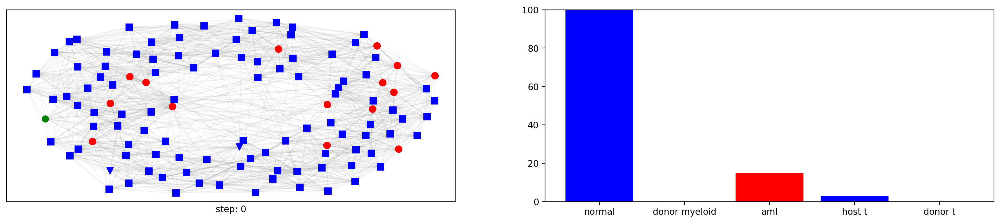

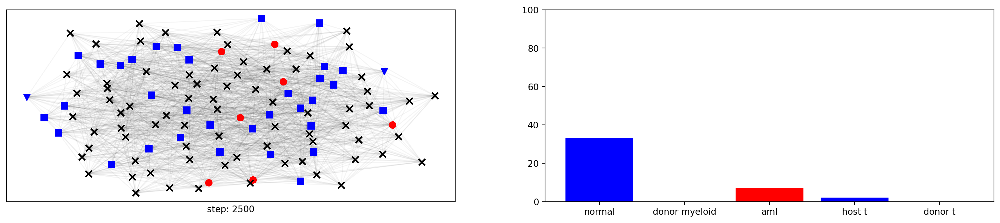

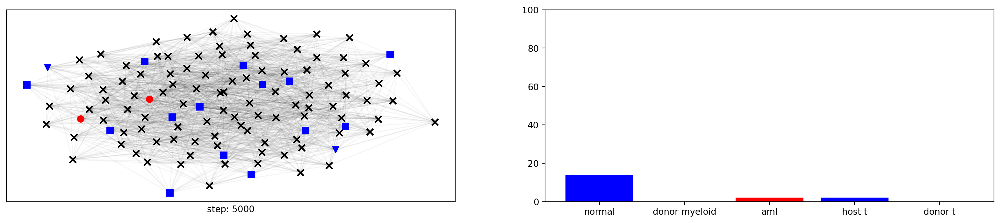

In [971]:
immune_system = ImmuneSystem(cell_myeloid_count=0)
immune_system.observe_frames(step_size=2500, total_frames=5000)

## Non-depleted HSCT

In [972]:
outcomes_no_depletion_low_mhc = run_simulation(t_deplete_perc=1.0, mhc_overlap_perc=0.2)

In [973]:
calculate_desc_stats(outcomes_no_depletion_low_mhc)

{'survival_overall': {'mean': 1609.4,
  '95_confint_high': 2848.0999999999995,
  '95_confint_low': 578.325},
 'survival_no_gvhd': {'mean': 1048.66,
  '95_confint_high': 1680.875,
  '95_confint_low': 495.125},
 'survival_no_relapse': {'mean': 2154.78,
  '95_confint_high': 4999.0,
  '95_confint_low': 390.90000000000003},
 'remission_time': {'mean': 2415.38,
  '95_confint_high': 5000.0,
  '95_confint_low': 814.95}}

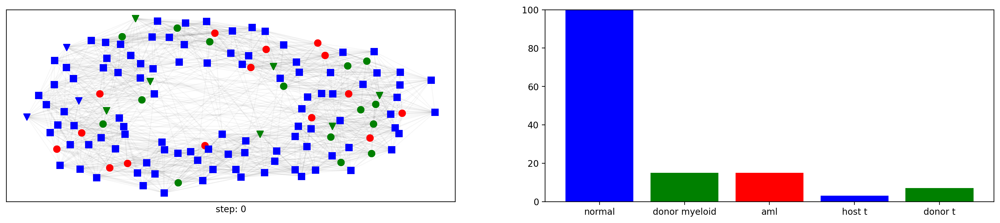

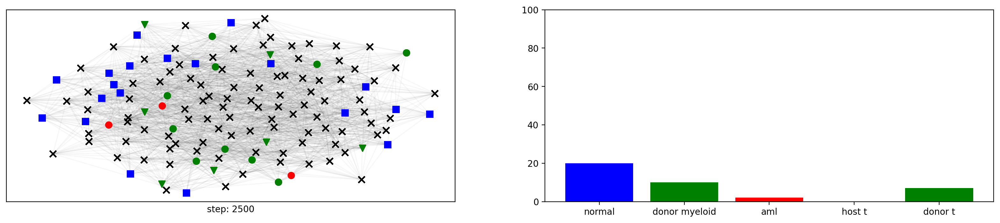

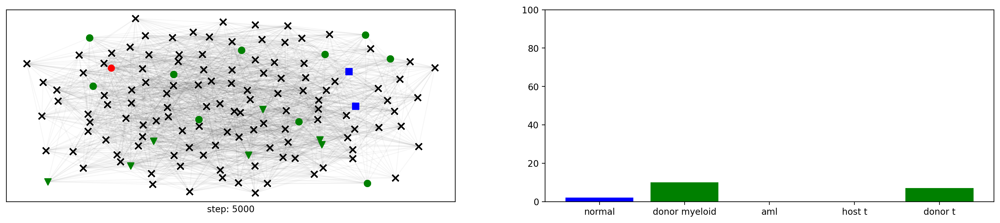

In [974]:
# suppl fig 2.1
immune_system = ImmuneSystem(t_deplete_perc=1, mhc_overlap_perc=0.2)
immune_system.observe_frames(step_size=2500, total_frames=5000)

In [975]:
outcomes_no_depletion_high_mhc = run_simulation(t_deplete_perc=1.0, mhc_overlap_perc=0.8)

In [976]:
calculate_desc_stats(outcomes_no_depletion_high_mhc)

{'survival_overall': {'mean': 2058.66,
  '95_confint_high': 4054.6249999999995,
  '95_confint_low': 916.5},
 'survival_no_gvhd': {'mean': 1950.78,
  '95_confint_high': 3697.1749999999997,
  '95_confint_low': 822.9},
 'survival_no_relapse': {'mean': 1853.38,
  '95_confint_high': 3945.0999999999995,
  '95_confint_low': 696.325},
 'remission_time': {'mean': 3841.6,
  '95_confint_high': 5000.0,
  '95_confint_low': 1797.7}}

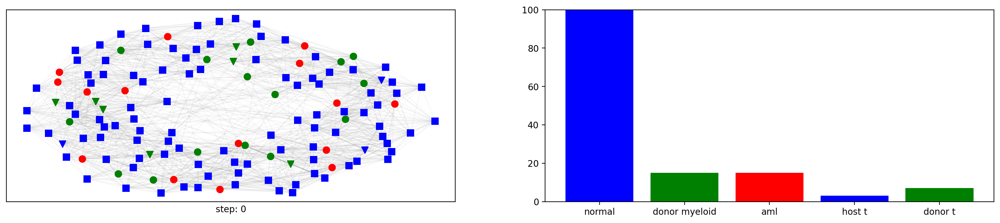

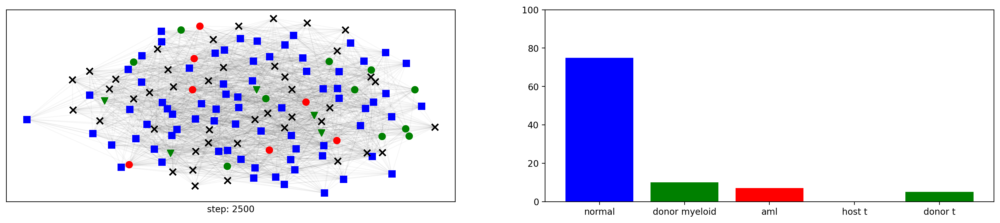

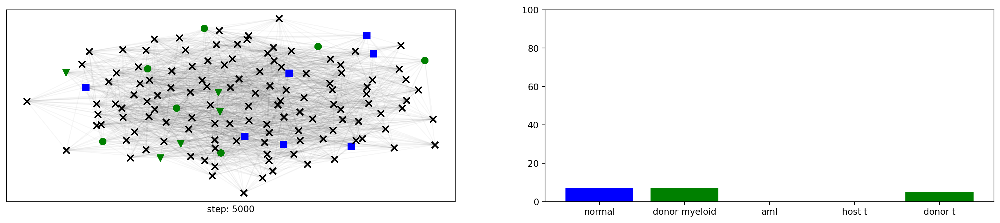

In [977]:
# suppl fig 2.2
immune_system = ImmuneSystem(t_deplete_perc=1.0, mhc_overlap_perc=0.8)
immune_system.observe_frames(step_size=2500, total_frames=5000)

## Low depletion of HSCT

In [978]:
outcomes_low_depletion_low_mhc = run_simulation(t_deplete_perc=0.9, mhc_overlap_perc=0.2)

In [979]:
calculate_desc_stats(outcomes_low_depletion_low_mhc)

{'survival_overall': {'mean': 1566.02,
  '95_confint_high': 3190.55,
  '95_confint_low': 490.57500000000005},
 'survival_no_gvhd': {'mean': 1123.64,
  '95_confint_high': 1901.3249999999998,
  '95_confint_low': 389.25},
 'survival_no_relapse': {'mean': 1960.08,
  '95_confint_high': 4999.0,
  '95_confint_low': 262.9},
 'remission_time': {'mean': 2434.1,
  '95_confint_high': 5000.0,
  '95_confint_low': 973.2}}

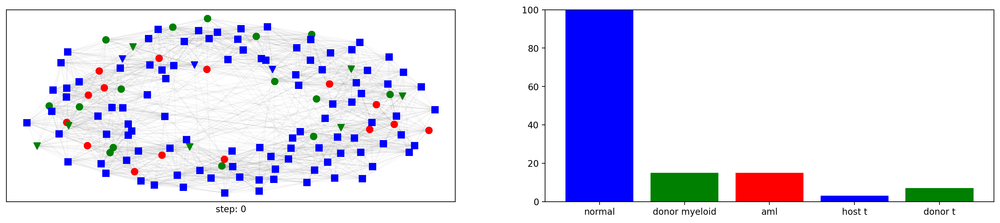

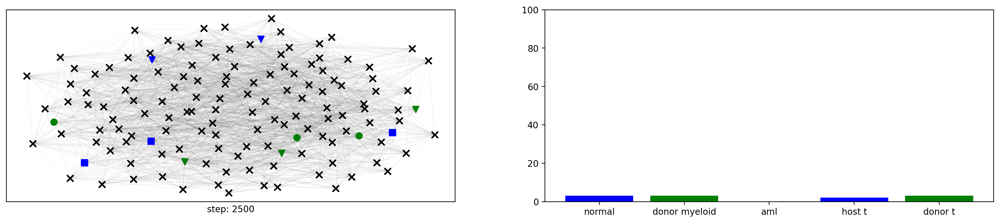

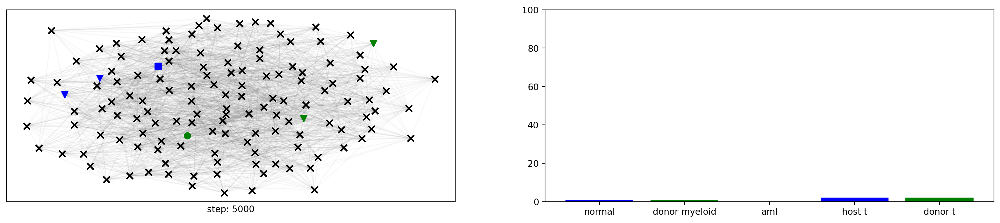

In [980]:
immune_system = ImmuneSystem(t_deplete_perc=0.9, mhc_overlap_perc=0.2)
immune_system.observe_frames(step_size=2500, total_frames=5000)

In [981]:
outcomes_low_depletion_high_mhc = run_simulation(t_deplete_perc=0.9, mhc_overlap_perc=0.8)

In [982]:
calculate_desc_stats(outcomes_low_depletion_high_mhc)

{'survival_overall': {'mean': 2020.72,
  '95_confint_high': 4336.674999999999,
  '95_confint_low': 798.0250000000001},
 'survival_no_gvhd': {'mean': 1887.9,
  '95_confint_high': 3767.2999999999997,
  '95_confint_low': 711.4749999999999},
 'survival_no_relapse': {'mean': 1773.72,
  '95_confint_high': 3704.4999999999995,
  '95_confint_low': 584.05},
 'remission_time': {'mean': 4069.7,
  '95_confint_high': 5000.0,
  '95_confint_low': 2036.725}}

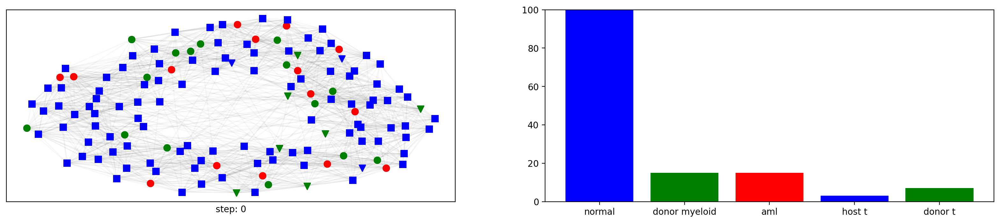

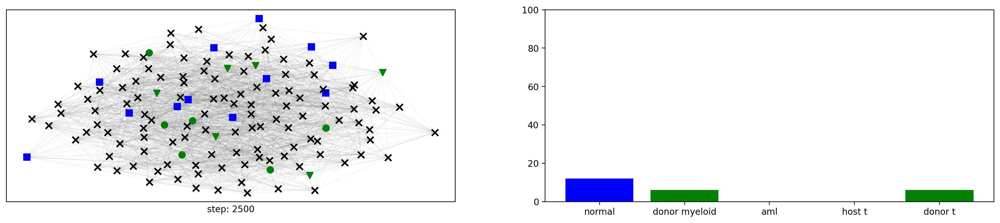

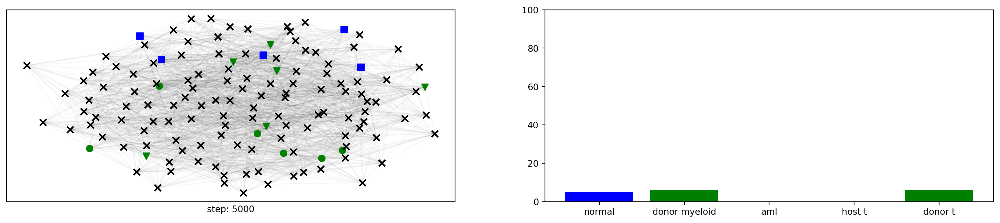

In [983]:
immune_system = ImmuneSystem(t_deplete_perc=0.9, mhc_overlap_perc=0.8)
immune_system.observe_frames(step_size=2500, total_frames=5000)

## Moderate depletion of HSCT

In [986]:
outcomes_med_depletion_low_mhc = run_simulation(t_deplete_perc=0.5, mhc_overlap_perc=0.2)

In [987]:
calculate_desc_stats(outcomes_med_depletion_low_mhc)

{'survival_overall': {'mean': 1334.0,
  '95_confint_high': 3668.0499999999997,
  '95_confint_low': 461.55},
 'survival_no_gvhd': {'mean': 1093.94,
  '95_confint_high': 2301.4249999999997,
  '95_confint_low': 387.125},
 'survival_no_relapse': {'mean': 1066.08,
  '95_confint_high': 3126.874999999998,
  '95_confint_low': 249.275},
 'remission_time': {'mean': 3235.3,
  '95_confint_high': 5000.0,
  '95_confint_low': 1046.075}}

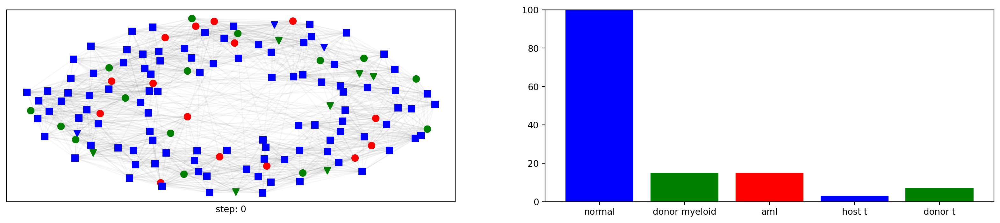

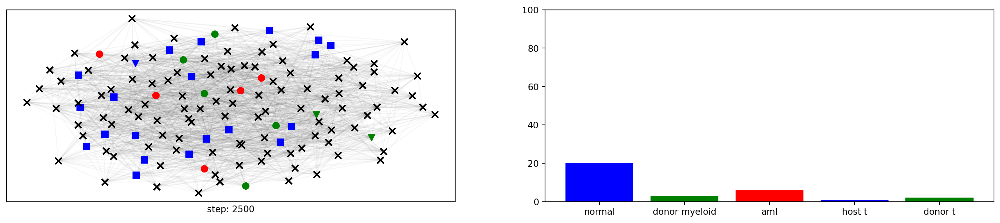

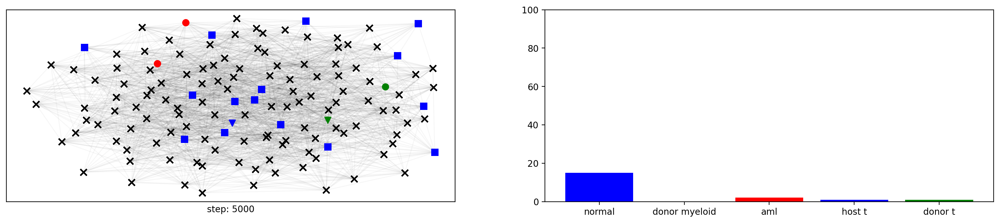

In [988]:
immune_system = ImmuneSystem(t_deplete_perc=0.5, mhc_overlap_perc=0.2)
immune_system.observe_frames(step_size=2500, total_frames=5000)

In [989]:
outcomes_med_depletion_high_mhc = run_simulation(t_deplete_perc=0.5, mhc_overlap_perc=0.8)

In [990]:
calculate_desc_stats(outcomes_med_depletion_high_mhc)

{'survival_overall': {'mean': 1812.98,
  '95_confint_high': 3251.5249999999996,
  '95_confint_low': 796.025},
 'survival_no_gvhd': {'mean': 1713.8,
  '95_confint_high': 3167.0249999999996,
  '95_confint_low': 707.9},
 'survival_no_relapse': {'mean': 1584.28,
  '95_confint_high': 3031.775,
  '95_confint_low': 584.35},
 'remission_time': {'mean': 4301.94,
  '95_confint_high': 5000.0,
  '95_confint_low': 2416.625}}

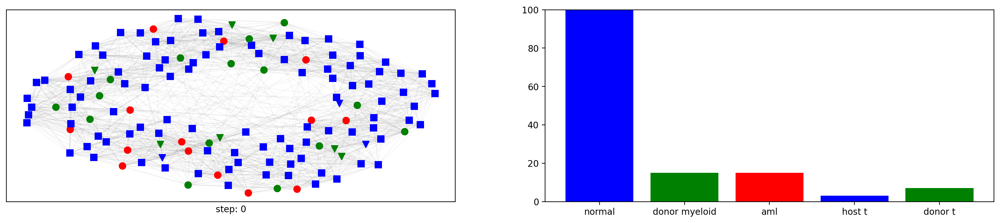

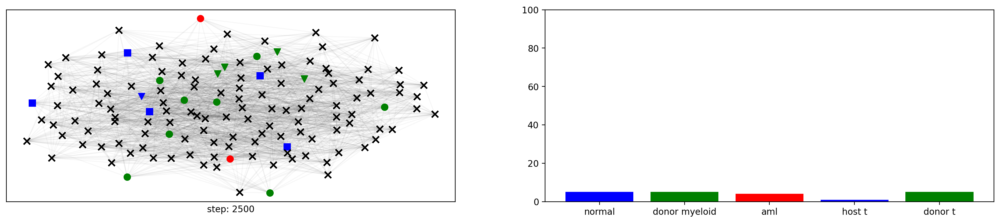

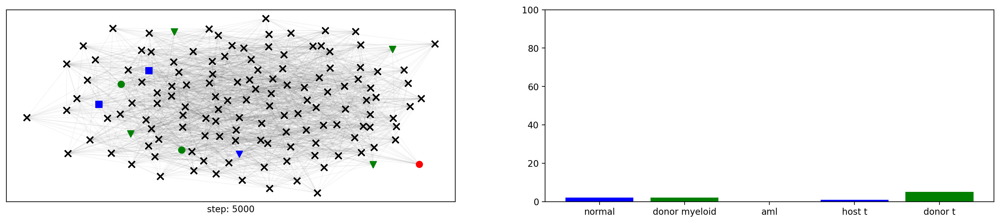

In [991]:
immune_system = ImmuneSystem(t_deplete_perc=0.5, mhc_overlap_perc=0.8)
immune_system.observe_frames(step_size=2500, total_frames=5000)

## High depletion of HSCT

In [992]:
outcomes_high_depletion_low_mhc = run_simulation(t_deplete_perc=0.1, mhc_overlap_perc=0.2)

In [993]:
calculate_desc_stats(outcomes_high_depletion_low_mhc)

{'survival_overall': {'mean': 1079.56,
  '95_confint_high': 1716.6,
  '95_confint_low': 592.1},
 'survival_no_gvhd': {'mean': 928.44,
  '95_confint_high': 1515.625,
  '95_confint_low': 508.82500000000005},
 'survival_no_relapse': {'mean': 785.68,
  '95_confint_high': 1348.5,
  '95_confint_low': 354.35},
 'remission_time': {'mean': 4425.04,
  '95_confint_high': 5000.0,
  '95_confint_low': 2482.825}}

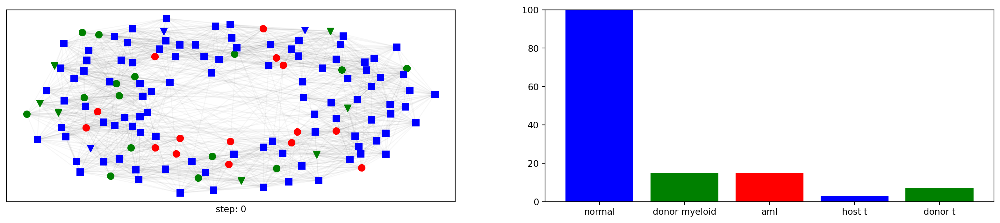

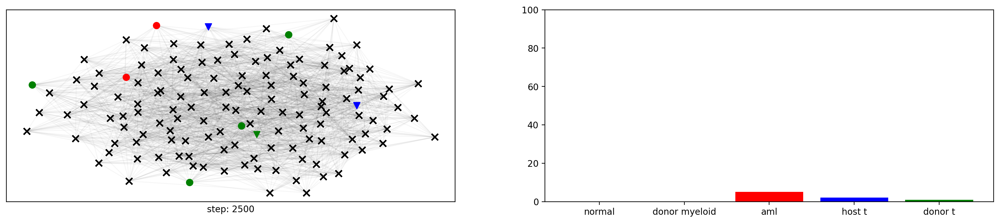

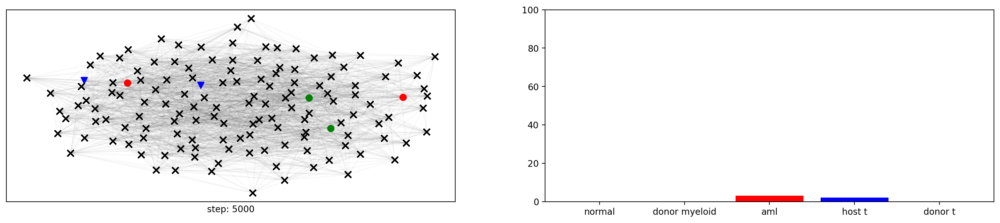

In [994]:
immune_system = ImmuneSystem(t_deplete_perc=0.1, mhc_overlap_perc=0.2)
immune_system.observe_frames(step_size=2500, total_frames=5000)

In [997]:
outcomes_high_depletion_high_mhc = run_simulation(t_deplete_perc=0.1, mhc_overlap_perc=0.8)

In [998]:
calculate_desc_stats(outcomes_high_depletion_high_mhc)

{'survival_overall': {'mean': 1512.42,
  '95_confint_high': 2567.6499999999996,
  '95_confint_low': 771.325},
 'survival_no_gvhd': {'mean': 1406.8,
  '95_confint_high': 2431.3,
  '95_confint_low': 619.75},
 'survival_no_relapse': {'mean': 1255.68,
  '95_confint_high': 2286.925,
  '95_confint_low': 469.475},
 'remission_time': {'mean': 4994.32,
  '95_confint_high': 5000.0,
  '95_confint_low': 4894.6}}

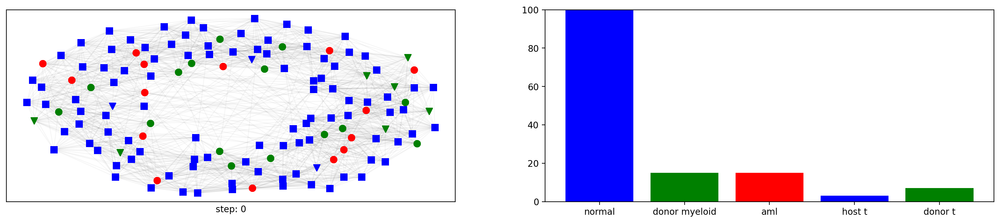

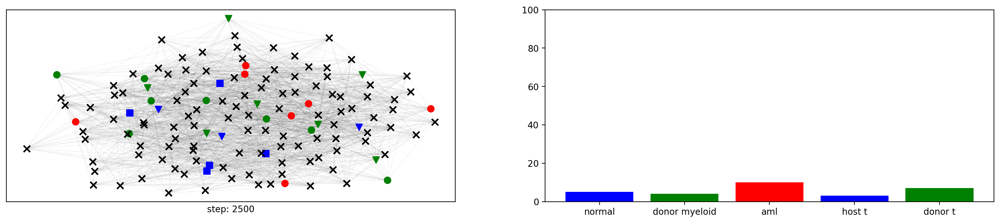

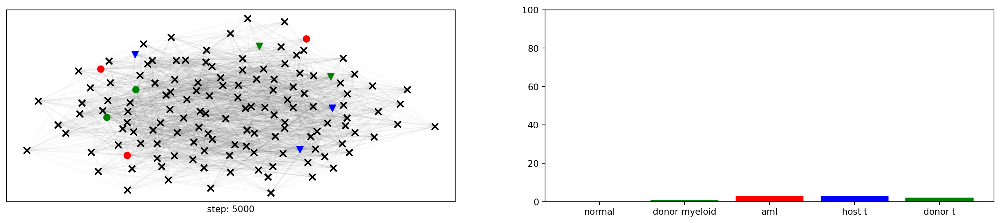

In [999]:
immune_system = ImmuneSystem(t_deplete_perc=0.1, mhc_overlap_perc=0.8)
immune_system.observe_frames(step_size=2500, total_frames=5000)